In [1]:
from pyspark.sql import SparkSession
from pyspark.sql import functions as F
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Web Interaction and Display
from IPython.display import Image, display, HTML

# Additional JavaScript for toggling code display in Jupyter Notebooks
HTML(
    """
<script src="https://cdnjs.cloudflare.com/ajax/libs/jquery/2.0.3/jquery.min.js "></script>
<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.jp-CodeCell > div.jp-Cell-inputWrapper').hide();
 } else {
 $('div.jp-CodeCell > div.jp-Cell-inputWrapper').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit"
    value="Click here to toggle on/off the raw code."></form>
"""
)

<div style="background-color:#000000 ; padding: 10px 0;">
    <center><h1 style="color: white; font-weight:bold">ABSTRACT</h1></center>
</div> 

<div style="background-color:#000000 ; padding: 10px 0;">
    <center><h1 style="color: white; font-weight:bold">INTRODUCTION</h1></center>
</div> 

<div style="background-color:#880808 ; padding: 10px 0;">
    <center><h2 style="color: white; font-weight:bold">Background</h2></center>
</div> 

On the 9th of May in 2016, the Philippines elected a new leader. Rodrigo “Digong” Duterte, then 71 years old, won the presidential election in a landslide victory (34%) on the back of his hardline promises to combat the illegal drug trade in the country. He had built a reputation as an uncompromising, results-oriented mayor of Davao City, where he served for over two decades, and who placed emphasis on law and order over the legal safeguards for alleged offenders.

In his campaigns, Duterte vowed to launch a large-scale anti-drug campaign that is reminiscent of his tenure as mayor of Davao. Indeed, shortly after assuming the presidency in June, he openly encouraged the public to [“go ahead and kill”](https://www.independent.co.uk/news/world/asia/philippines-president-rodrigo-duterte-tells-people-to-go-ahead-and-kill-drug-addicts-a7116456.html) drug addicts (Worley, 2016), which justified vigilante assaults on individuals suspected of involvement in the drug trade or substance abuse. Law enforcement agencies conducted extensive raids and the Philippine National Police (PNP) divulged a [list](https://www.rappler.com/nation/142210-duterte-list-lgu-police-officials-linked-drugs/) of high-ranking officials and influential figures allegedly complicit in the drug trade, a list later proven to be inadequately substantiated (Suarez, 2016).

Despite ethical concerns surrounding Duterte’s anti-drug campaign, many Filipinos regarded his draconian tactics as necessary to combat a grave social issue. In fact, public support was strong at the end of 2016 with an 85% approval rating—although this decreased slightly to 78% by mid-2018 (Flores, 2018; (Office of the Communications Secretary, 2016).

Duterte’s ability to execute his war on drugs can be attributed to several factors. The premise of this paper rests on two explanations for the success of Duterte’s tactics on the drug war (Philippine Politics Under Duterte: A Midterm Assessment, n.d.):
    
1.	**A slow and ineffective justice system**. Confronted by a combination of sluggish and corrupt judicial system, most Filipinos were willing to tolerate any politician who made promises and delivered on them. This was significantly different from when college students and activists were targeted during the Marcos regime, which caused public outrage. This is because drug dealers and addicts are a stigmatized group,  so it is more difficult for them to gain political support for the defense of their rights.
2.	**An indication of government responsiveness**. It’s rare for multiple government bodies, including the PNP, national agencies, and local authorities, to collaborate in addressing pressing societal concerns, so Duterte’s whole-of-government approach engendered an increased sense of security among Filipinos.

<div style="background-color:#880808 ; padding: 10px 0;">
    <center><h2 style="color: white; font-weight:bold">Problem Statement & Objectives</h2></center>
</div> 

This paper aims to serve as a prototype of what the Philippine judicial system and government authorities could use as support to strengthen its crime prevention efforts and reduce the opportunities for crime. It concentrates on the first week of October 2016, three months after Duterte assumed office, and seeks to address the following key questions:

1.	What was the nature and scale of the events reported during the first week of October 2016, particularly those related to Duterte’s war on drugs?
2.	How did these events compare to the corresponding period in the previous year, before Duterte took office?
3.	How did the situation in the Philippines during that period compare to neighboring countries in Southeast Asia?
4.	Were there any concerning patterns or anomalies that emerged, potentially indicating human rights violations or excessive use of force?

In a hypothetical world where the loyalty of our law enforcement system lies solely with the rule of law and not with any specific administration, the ultimate goal of this paper is to <b style='color:#880808'>create a model for future administrations to proactively address pressing issues while upholding the rule of law and protecting the rights of all citizens</b>, regardless of their socioeconomic status or alleged involvement in illegal activities. Using data from the Global Database of Events, Language, and Tone (GDELT) Project, we explore whether a data-driven approach could have provided early insights or warnings regarding the potential consequences of Duterte’s policies. 

The findings could also <b style='color:#880808'>lay the groundwork for a global monitoring system</b> that international organizations, such as the United Nations, could use to respond more promptly on global issues. The UN Human Rights Council did not vote to establish an investigation into the alleged crimes during the Duterte administration’s anti-drug campaign until 2019 (Philippines Drugs War: UN Votes to Investigate Killings, 2019). Since 2016, law enforcement has acknowledged at least 6,600 dealer or users killed, but activists argue that more than 27,000 individuals have died.

<div id="data-sources-description" style="background-color:#000000 ; padding: 10px 0;">
    <center><h1 style="color: white; font-weight:bold">DATA SOURCES AND DESCRIPTION</h1></center>
</div>

The **GDELT (Global Data of Events, Language, and Tone) Project** is a comprehensive global monitoring system that tracks news content from broadcasters, print media, and websites in numerous languages across almost every country in the world. It employs advanced techniques to identify and extract key elements driving global discourse and events, such as people, locations, organizations, topics, sources, sentiments, numerical data, quotations, images, and events. By continuously processing this immense stream of information on a second-by-second basis, GDELT generates a freely accessible open data platform that enables computational analysis of the world's events, narratives, and societal forces in real-time.

GDELT has several [datasets](https://www.gdeltproject.org/data.html). This study uses the **Global Knowledge Graph** (GKG) dataset to explore global news coverage. The GKG captures the key dimensions, geographic trends, and connections in the news by using sophisticated natural language processing algorithms. These algorithms generate and encode a wide range of metadata, highlighting the hidden and contextual details in each document. Essentially, the GKG creates a vast network linking people, organizations, locations, numerical data, themes, news sources, and events from around the world. This interconnected network provides insights into global events, the contexts and entities involved, and the sentiments surrounding these events, offering a daily comprehensive view of our global society.

The GKG dataset has the following fields:

| Field Name                    | Description |
|-------------------------------|-------------|
| `GKGRECORDID`                   | Each GKG record is assigned a globally unique identifier in a date-oriented serial number format. |
| `V2.1DATE`                      | The publication date of the news media used to construct the GKG file, in YYYYMMDDHHMMSS format. |
| `V2SOURCECOLLECTIONIDENTIFIER`  | A numeric identifier specifying the source collection the document came from. |
| `V2SOURCECOMMONNAME`            | A human-friendly identifier of the source of the document. |
| `V2DOCUMENTIDENTIFIER`          | The unique external identifier for the source document. |
| `V1COUNTS`                      | A semicolon-delimited list of counts found in the document, each separated by the pound symbol. |
| `V2.1COUNTS`                    | Similar to V1COUNTS but includes character offsets for each count. |
| `V1THEMES`                      | A semicolon-delimited list of all themes found in the document. |
| `V2ENHANCEDTHEMES`              | Includes all GKG themes referenced in the document along with character offsets. |
| `V1LOCATIONS`                   | A semicolon-delimited list of all locations found in the text, extracted using the Leetaru algorithm. |
| `V2ENHANCEDLOCATIONS`           | Similar to V1LOCATIONS but includes an extra field for character offsets and additional details. |
| `V1PERSONS`                     | A semicolon-delimited list of all person names found in the text. |
| `V2ENHANCEDPERSONS`             | Includes all person names referenced in the document along with character offsets. |
| `V1ORGANIZATIONS`               | A semicolon-delimited list of all company and organization names found in the text. |
| `V2ENHANCEDORGANIZATIONS`       | Includes all organizations/companies referenced in the document along with character offsets. |
| `V1.5TONE`                      | A list of six core emotional dimensions, each recorded as a single precision floating point number. |
| `V2.1ENHANCEDDATES`             | Contains a list of all date references in the document, along with character offsets. |
| `V2GCAM`                        | The Global Content Analysis Measures field, runs an array of content analysis systems over each document. |
| `V2.1SHARINGIMAGE`              | Specifies a "sharing image" for each article as specified by news websites. |
| `V2.1RELATEDIMAGES`             | A list of URLs of images deemed most relevant to the core story of the article. |
| `V2.1SOCIALIMAGEEMBEDS`         | A list of URLs of image-based social media posts embedded in articles. |
| `V2.1SOCIALVIDEOEMBEDS`         | A list of URLs of videos embedded in articles from various platforms like YouTube, Vimeo, etc. |
| `V2.1QUOTATIONS`                | Extracts and segments all quoted statements from each article. |
| `V2.1ALLNAMES`                  | Contains a list of all proper names referenced in the document, along with character offsets. |
| `V2.1AMOUNTS`                   | Contains a list of all precise numeric amounts referenced in the document, along with character offsets. |
| `V2.1TRANSLATIONINFO`           | Records provenance information for machine translated documents. |
| `V2EXTRASXML`                   | Reserved to hold special non-standard data applicable to special subsets of the GDELT collection. |


<center><small><b>Table X.</b> GDELT's GKG Features and description. </small></center>

<div style="background-color:#880808 ; padding: 10px 0;">
    <center><h2 style="color: white; font-weight:bold">Key Data Columns</h2></center>
</div> 

This study extracted insights primarily using the following columns: `V1COUNTS`, `V1THEMES`, and `V1LOCATIONS`. Detailed information on `V1COUNTS` and `V1THEMES` is provided below.

### `V1COUNTS`

**Sample Entry:**
```
["ARREST#400#political#4#Rossiya, Orenburgskaya Oblast', Russia#RS#RS55#52.4#54.9833#-2993111;"]
```

**Description:**
- The `V1COUNTS` column contains data representing various categories of counts. The value is derived from the NAME field in the [Category List](https://view.officeapps.live.com/op/view.aspx?src=http%3A%2F%2Fdata.gdeltproject.org%2Fdocumentation%2FGDELT-Global_Knowledge_Graph_CategoryList.xlsx&wdOrigin=BROWSELINK) spreadsheet. Common categories include `AFFECT`, `ARREST`, `KIDNAP`, `KILL`, `PROTEST`, `SEIZE`, and `WOUND`. Other categories may also appear depending on the context and as new Count categories are introduced over time.
- For instance, a value of "PROTEST" in this field would indicate the count of protesters at a protest.

**Count Types:**

| Count Type  | Description                                                                                             |
|-------------|---------------------------------------------------------------------------------------------------------|
| `AFFECT`    | Captures a range of impacts including sickness, evacuations, displaced persons, and more.               |
| `ARREST`    | Includes mentions of arrests, detentions, imprisonments, and similar actions.                           |
| `DISPLACED` | Counts instances of people being displaced; see `REFUGEES` for mentions of refugees and forced migration.|
| `EVACUATION`| Mentions of evacuations.                                                                                |
| `KIDNAP`    | Instances of kidnappings, abductions, and hostage situations.                                           |
| `KILL`      | Any mention of deaths.                                                                                  |
| `PROTEST`   | Discussions of protests, demonstrations, riots, strikes, and related activities.                        |
| `REFUGEES`  | Counts mentions of refugees, displaced persons, forced migration, and asylum seekers.                   |
| `SEIZE`     | Instances of seizures, often involving drugs or illegal materials.                                      |
| `SICKENED`  | Counts of mentions related to sickness.                                                                 |
| `WOUND`     | Any mention of injuries or wounds.                                                                      |

<center><small><b>Table X.</b> Different 'CountTypes' as indicated in the documentation of GDELT.</small></center>

### `V1THEMES`

**Sample Entry:**
```
SELF_IDENTIFIED_HUMAN_RIGHTS;FREESPEECH;POLITICAL_PRISONER;PROTEST;MOVEMENT_GENERAL;
```

**Description:**
- The `V1THEMES` column includes various themes associated with the dataset. A comprehensive description of the 284 themes, including the count types mentioned earlier, can be found [here](https://view.officeapps.live.com/op/view.aspx?src=http%3A%2F%2Fdata.gdeltproject.org%2Fdocumentation%2FGDELT-Global_Knowledge_Graph_CategoryList.xlsx&wdOrigin=BROWSELINK). However, this list is not exhaustive; some themes present in the dataset lack descriptions in the linked file and need to be sourced externally. For example, additional theme information can be found [here](https://blog.gdeltproject.org/crisislex-taxonomies-now-available-in-gkg/).

**Sample Theme Descriptions:**

| Theme                    | Description                                                                               |
|--------------------------|-------------------------------------------------------------------------------------------|
| `CORRUPTION`             | Mentions of corruption, kickbacks, embezzlement, profiteering, and similar activities.     |
| `CRIME_CARTELS`          | Focuses on mentions of drug cartels and drug corridors; does not currently list specific cartels.|
| `CRIME_COMMON_ROBBERY`   | Discussions of general crimes like pickpocketing, robbery, and street crime.               |
| `CRIME_ILLEGAL_DRUGS`    | Mentions of illegal drugs.                                                                 |
| `CYBER_ATTACK`           | Discussions of cyberwarfare, cyberattacks, phishing, hacking, hacktivists, viruses, etc.   |
<center><small><b>Table X.</b> Sample of 'Themes' and their description. </small></center>

<div style="background-color:#000000 ; padding: 10px 0;">
    <center><h1 style="color: white; font-weight:bold">METHODOLOGY</h1></center>
</div> 

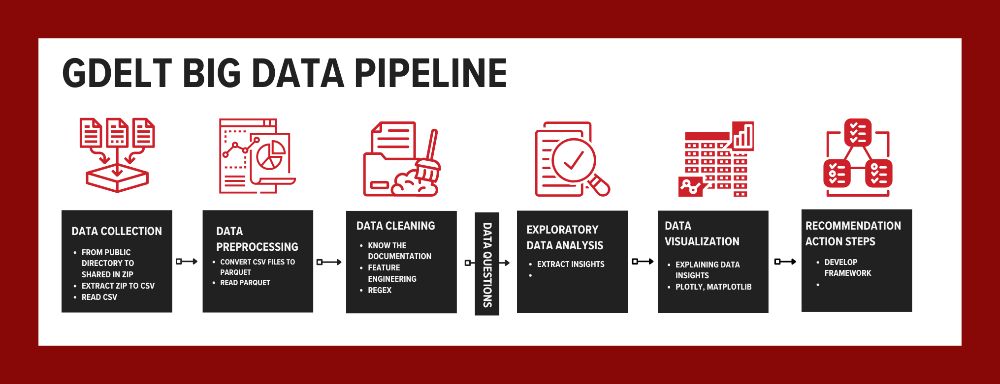
<center><small><b>Figure X.</b> The Data Pipeline for this study.</small></center>

<h3><b style='color:#880808'>Data Collection</b></h3>

As this paper aims to provide a prototype for a monitoring system, we selected an arbitrary period for exploration, focusing specifically on the <b style='color:#880808'>first week of October 2016</b>, three months after the Duterte administration began. To substantiate our analysis, we also <b style='color:#880808'>extracted data from the same period in 2015</b>. This approach allows us to observe any significant changes in the resulting analyses between the two years, attributed to Duterte assuming office.

1. Retrieve GDELT's zipped files from Jojie's public directory.
2. Transfer the files to a shared directory.
3. Extract the zipped files into CSV format for further processing.

<h3><b style='color:#880808'>Data Preprocessing</b></h3>

1. Convert the CSV files to parquet format for efficient processing.
2. Read the parquet files into the system.
            
*Note: The actual implementation of the data preprocessing step is found in a supplementary notebook.*

<h3><b style='color:#880808'>Data Cleaning</b></h3>

This step entailed understanding the comprehensive [documentation](https://blog.gdeltproject.org/gdelt-2-0-our-global-world-in-realtime/) of the dataset and familiarizing with the various codes present in the data. This phase also involved feature engineering, particularly separating information contained within a single column using regular expressions (Regex) to parse the text accurately.

<h3><b style='color:#880808'>Exploratory Data Analysis (EDA)</b></h3>

1. Extract insights using various data visualization techniques and data wrangling methods in PySpark.
2. Utilize tools such as Plotly and Matplotlib to create visual representations of the data.

<h3><b style='color:#880808'>Actionable Insights</b></h3>

1. Recommend actionable steps based on the gathered insights.

<div style="background-color:#880808 ; padding: 10px 0;">
    <center><h2 style="color: white; font-weight:bold">Data Cleaning</h2></center>
</div> 

In [2]:
spark = (SparkSession
     .builder
     .master('local[*]') # Master URL;
     .getOrCreate())

In [3]:
df = spark.read.parquet("/home/msds2024/jsoliman/cpt1_shared/slt1a/bdcc"\
                            "/201610/parquets")

df_2015 = spark.read.parquet("/home/msds2024/jsoliman/cpt1_shared/slt1a/"\
                            "bdcc/201510/parquets")

The GKG dataset contains a total of 2,087,088 rows and is initially structured as follows:

*Note: The sample dataframes will be displayed in their transposed form for clarity and to allow the readers to easily see the referenced columns.*

In [4]:
print(f"The dataset has {df.count()} rows.")
display(df.limit(1).toPandas().transpose())

The dataset has 2087088 rows.


,0
GKGRECORDID,20161006153000-0
V2.1DATE,20161006153000
V2SOURCECOLLECTIONIDENTIFIER,2
V2SOURCECOMMONNAME,BBC Monitoring
V2DOCUMENTIDENTIFIER,"Islamic Republic News Agency, Tehran/BBC Monit..."
V1COUNTS,None
V2.1COUNTS,None
V1THEMES,WB_2433_CONFLICT_AND_VIOLENCE;WB_2449_PARAMILI...
V2ENHANCEDTHEMES,"WB_2433_CONFLICT_AND_VIOLENCE,44;WB_2449_PARAM..."
V1LOCATIONS,None


<center><small><b>Table X.</b> Sample of a row displayed vertically.</small></center>

As previously mentioned in the [Data Sources and Description](#data-sources-description) section, the GKG dataset has a nested or hierarchical structure where some columns contain multiple pieces of information separated by delimiters. This necessitates the need to denormalize or unnest these nested information elements to capture more comprehensive and granular insights.

In particular, we explode the following columns:
- `V1COUNTS`: To extract the count types (`KILL`, `ARREST`, `PROTEST`, etc.)
- `V1LOCATIONS`: To extract the region, country, longitude, and latitude
- `V1THEMES`: To extract all the themes of every discussion
- `V1PERSONS`: To extract all the mentioned persons in every document

The resulting dataframes for 2015 and 2016 after the explosion and removal of unneeded columns have the following structure:

In [5]:
df_final = (df
            .withColumn("CountType", F.regexp_extract("V1COUNTS", r"^([^#]+)",
                                                      1))
            .withColumn("ExpandedLocation",
                        F.explode(F.split(
                            F.regexp_extract("V1LOCATIONS",
                                             r"(^|;)([^#]+#[^#]+#[^#]+)",
                                             0), ";")))
            .withColumn("ExtractedLocation",
                        F.regexp_extract("ExpandedLocation", r"#([^#]+)#", 1))
            .withColumn("Region",
                        F.element_at(F.split(F.col("ExtractedLocation"),", "),
                                     1))
            .withColumn("Country",
                        F.element_at(F.split(F.col("ExtractedLocation"), ", "),
                                     -1))
            .withColumn("Region", F.when(F.col("Region") == F.col("Country"),
                                         None).otherwise(F.col("Region")))
            .withColumn("Themes_List", F.split(F.col("V1THEMES"), ";"))
            .withColumn("Persons_List", F.split(F.col("V1PERSONS"), ";"))
            .drop("ExpandedLocation", "ExtractedLocation",
                  "V2.1DATE", "V2.1ENHANCEDDATES", "V2GCAM",
                  "V2.1SHARINGIMAGE", "V2.1RELATEDIMAGES",
                  "V2.1SOCIALIMAGEEMBEDS", "V2.1SOCIALVIDEOEMBEDS",
                  "V2.1QUOTATIONS", "V2.1ALLNAMES", "V2.1AMOUNTS",
                  "V2.1TRANSLATIONINFO", "V2EXTRASXML")
           )

df_final_2015 = (df_2015
                 .withColumn("CountType", F.regexp_extract("V1COUNTS",
                                                           r"^([^#]+)", 1))
                 .withColumn("ExpandedLocation",
                             F.explode(F.split(
                                 F.regexp_extract("V1LOCATIONS",
                                                  r"(^|;)([^#]+#[^#]+#[^#]+)",
                                             0), ";")))
                 .withColumn("ExtractedLocation",
                             F.regexp_extract("ExpandedLocation",
                                              r"#([^#]+)#", 1))
                 .withColumn("Region",
                             F.element_at(F.split(F.col("ExtractedLocation"),
                                                  ", "), 1))
                 .withColumn("Country",
                             F.element_at(F.split(F.col("ExtractedLocation"),
                                                  ", "), -1))
                 .withColumn("Region",
                             F.when(F.col("Region") == F.col("Country"),
                                    None).otherwise(F.col("Region")))
                 .withColumn("Themes_List", F.split(F.col("V1THEMES"), ";"))
                 .withColumn("Persons_List", F.split(F.col("V1PERSONS"), ";"))
                 .drop("ExpandedLocation", "ExtractedLocation",
                       "V2.1DATE", "V2.1ENHANCEDDATES", "V2GCAM",
                       "V2.1SHARINGIMAGE", "V2.1RELATEDIMAGES",
                       "V2.1SOCIALIMAGEEMBEDS", "V2.1SOCIALVIDEOEMBEDS",
                       "V2.1QUOTATIONS", "V2.1ALLNAMES", "V2.1AMOUNTS",
                       "V2.1TRANSLATIONINFO", "V2EXTRASXML")
                )


In [6]:
display(df_final.limit(5).toPandas().transpose())

,0,1,2,3,4
GKGRECORDID,20161006153000-2,20161006153000-3,20161006153000-4,20161006153000-6,20161006153000-8
V2SOURCECOLLECTIONIDENTIFIER,2,2,1,1,1
V2SOURCECOMMONNAME,BBC Monitoring,BBC Monitoring,ap.org,wharfedaleobserver.co.uk,siouxcityjournal.com
V2DOCUMENTIDENTIFIER,News/BBC Monitoring/(c) BBC,"Interfax-Ukraine news agency, Kiev/BBC Monitor...",http://bigstory.ap.org/article/dade98ba770f4e4...,http://www.wharfedaleobserver.co.uk/news/natio...,http://siouxcityjournal.com/business/average-u...
V1COUNTS,None,None,"AFFECT#2#counties#2#Florida, United States#US#...",ARREST#5#teenagers#1#Poland#PL#PL#52#20#PL;SOC...,None
V2.1COUNTS,None,None,"AFFECT#2#counties#2#Florida, United States#US#...",ARREST#5#teenagers#1#Poland#PL#PL#52#20#PL#0;S...,None
V1THEMES,LEADER;TAX_FNCACT;TAX_FNCACT_PRESIDENT;USPEC_P...,MEDIA_MSM;CRISISLEX_CRISISLEXREC;TAX_ETHNICITY...,TAX_WORLDMAMMALS;TAX_WORLDMAMMALS_CAT;NATURAL_...,ARREST;SOC_GENERALCRIME;CRISISLEX_C07_SAFETY;T...,WB_336_NON_BANK_FINANCIAL_INSTITUTIONS;WB_1920...
V2ENHANCEDTHEMES,"TAX_FNCACT_CANDIDATES,564;TAX_FNCACT_JUDGES,61...","WB_678_DIGITAL_GOVERNMENT,1663;WB_694_BROADCAS...","WATER_SECURITY,11267;WATER_SECURITY,11373;SHOR...","SEIZE,1098;TAX_FNCACT_INSPECTOR,642;WB_2024_AN...","GENERAL_GOVERNMENT,553;EPU_POLICY_GOVERNMENT,5..."
V1LOCATIONS,"4#Pretoria, Gauteng, South Africa#SF#SF06#-25....","4#Kiev, Ukraine (General), Ukraine#UP#UP00#50....","3#Charleston, South Carolina, United States#US...","1#Poland#PL#PL#52#20#PL;5#Essex, Essex, United...","3#Washington, Washington, United States#US#USD..."
V2ENHANCEDLOCATIONS,1#South Africans#SF#SF##-29#24#SF#592;4#Pretor...,1#Ukrainian#UP#UP##49#32#UP#78;1#Ukrainian#UP#...,"3#Orlando, Florida, United States#US#USFL#FL09...","1#Polish#PL#PL##52#20#PL#35;5#Essex, Essex, Un...","3#Washington, Washington, United States#US#USD..."


<center><small><b>Table X.</b> Displaying the final dataframe with Feature Engineering of text data. </small></center>

Additionally, we created two separate dataframes: one containing discussions specific to the Philippines and another encompassing its neighboring countries in Southeast Asia (SEA). This approach enables us to provide deeper context and substance to insights specific to the Philippines by considering regional dynamics and discussions in nearby countries.

In [7]:
# Filtering the DataFrame for SEA countries
sea_countries = ["Brunei", "Cambodia", "Indonesia", "Laos", "Malaysia",
                 "Myanmar", "Philippines", "Singapore", "Thailand", "Vietnam",
                 "East Timor"]

# 2016 dataframes
df_sea_ph = (df_final
             .filter(F.col('Country')
                     .isin(sea_countries))
            )


df_ph = (df_sea_ph
         .filter(F.col('Country')
                 .rlike('Philippines')
                )
        )

df_sea = (df_sea_ph
         .filter(~F.col('Country')
                 .rlike('Philippines')
                )
        )

# 2015 dataframes
df_sea_ph_2015 = (df_final_2015
                  .filter(F.col('Country')
                         .isin(sea_countries))
                 )

df_ph_2015 = (df_sea_ph_2015
              .filter(F.col('Country')
                      .rlike('Philippines')
                     )
             )

df_sea_2015 = (df_sea_ph_2015
               .filter(~F.col('Country')
                       .rlike('Philippines')
                      )
              )


# print("Dataframe of the Philippines:")
# display(df_ph.limit(1).toPandas().transpose())
# print("\nDataframe of the neighboring countries in SEA:")
# display(df_sea.limit(1).toPandas().transpose())

<div style="background-color:#000000 ; padding: 10px 0;">
    <center><h1 style="color: white; font-weight:bold">EXPLORATORY DATA ANALYSIS</h1></center>
</div> 

<div style="background-color:#880808 ; padding: 10px 0;">
    <center><h5 style="color: white; font-weight:bold">How many distinct counts were made for each type, such as kill, arrest, protest, etc. in the Philippines?</h3></center>
</div> 

The data paints a *potentially* concerning picture of the documents in the Philippines during the first week of October 2016, shortly after the new Duterte administration took office in the Philippines. 

The most striking observation from the data is the extraordinarily high number of reports related to "KILL" events, which stands at 1,426. This suggests that there was a significant amount of coverage on killings or deaths during that particular week.

Other notable events reported include "ARREST" (438 reports), "KIDNAP" (207 reports), and "AFFECT" (200 reports), indicating a considerable emphasis on law enforcement actions, abductions, and incidents with broader impacts.
    
The plot also highlights reports of "WOUND" (73), "SEIZE" (49), "PROTEST" (31), and "EVACUATION" (4) events, suggesting instances of injuries, confiscations or raids, demonstrations, and displacements of people.

Additionally, there are isolated reports related to "SOC_POINTSOFINTEREST_JAIL" (2), "CRISISLEX_T03_DEAD" (1), and "POVERTY" (1), which could indicate discussions or mentions of incarceration facilities, crisis-related deaths, and issues of poverty, respectively.

In [8]:
result = (df_ph
          .filter(F.col("CountType").isNotNull())
          .groupBy("CountType")
          .count()
          .orderBy("count", ascending=False)
          .limit(5)
          .toPandas()
         )

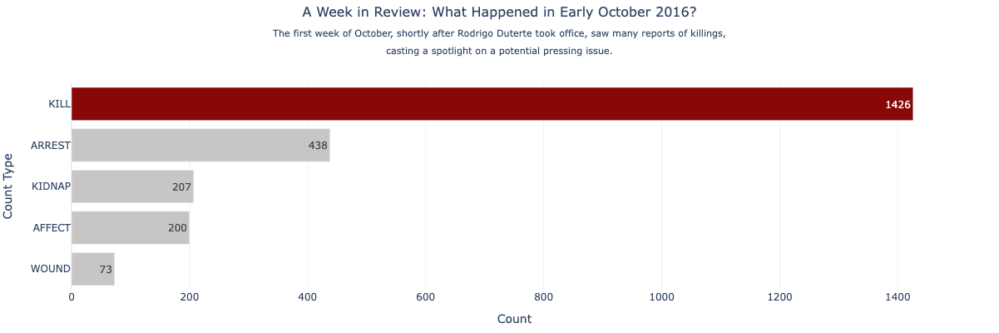

In [9]:
# Visualizing
# Extract the max count to highlight the corresponding bar
result_asc = result.sort_values(by="count", ascending=True)

# Extract the max count to highlight the corresponding bar
max_count = result_asc["count"].max()

# Define colors for each bar, highlighting the highest one
colors = ["#C8C5C5" if count != max_count else '#880808'
          for count in result_asc["count"]]

# Initialize the figure
fig = go.Figure()

# Add a horizontal bar trace with dynamic colors
fig.add_trace(
    go.Bar(
        y=result_asc["CountType"],
        x=result_asc["count"],
        marker=dict(color=colors),
        text=result_asc["count"],
        orientation='h'
    )
)

# Set titles and labels
fig.update_layout(
    title={
        'text': (
            "A Week in Review: What Happened in Early October 2016?<br>"
            "<sub>The first week of October, shortly after Rodrigo Duterte "
            "took office, saw many reports of killings,<br>"
            "casting a spotlight on a potential pressing issue.</sub>"
        ),
        'y':0.95,  # Adjusts the vertical alignment of the title
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'pad': {'b': 20}
    },
    title_font_size=16,
    title_y=0.95,  # Adjust the title position downwards to create more space
    xaxis_title="Count",
    yaxis_title="Count Type",
    margin=dict(l=50, r=50, t=100, b=50),
    width=900,
    height=400,
    template="plotly_white"
)

# Show the plot
fig.show()

<center><small><b>Figure X.</b> A plot showing the number of "KILL" reports during the first week of October 2016.</small></center>

<div style="background-color:#880808 ; padding: 10px 0;">
    <center><h5 style="color: white; font-weight:bold">How do the numbers compare to the corresponding counts from the same period in the previous year (2015)?</h3></center>
</div> 

At this early stage, it is important to note that this high volume of "KILL"-related documents, or of any other type, is only **potentially** concerning for several reasons:

1. **Media Bias and Reporting Trends**: The data may reflect an increase in media reporting on certain types of events rather than an actual increase in the events themselves. Media outlets might have chosen to focus more on violent incidents due to heightened public interest on the Duterte administration or other editorial decisions.

2. **Data Limitations**: The dataset captures what is reported in the digital space, not necessarily what occurs. There may be underreporting or overreporting in certain areas, and the data might not fully represent the on-ground realities. This is precisely the reason why this methodology should only be used to <b style='color:#880808'><i>support</i> the government's actual findings</b>. Ideally, law enforcement agencies should have a separate and much more comprehensive monitoring system that would validate the outputs of the would-be dashboard based on this study. 

3. **Contextual Factors**: To address this uncertainty, the analysis should ideally extend to a wider time period to establish a trend attributable to the onset of the Duterte administration. However, due to current computational constraints, focusing on a specific week within the Duterte regime and comparing it to the same period in the previous year should suffice for now.

4. **Comparative Baseline**: Building on the previous point, to fully understand the significance of these numbers, they need to be compared against a baseline. Without comparing these figures to previous weeks, months, or similar periods in past years, it is difficult to assess whether there has been a significant change in the number of "KILL" events, or events of any other type. In our case, we compare our analyses to that the of the previous year (2015) during the same week.

In [10]:
result_2015 = (df_ph_2015
               .filter(F.col("CountType").isNotNull())
               .groupBy("CountType")
               .count()
               .orderBy("count", ascending=False)
               .limit(5)
               .toPandas()
              )

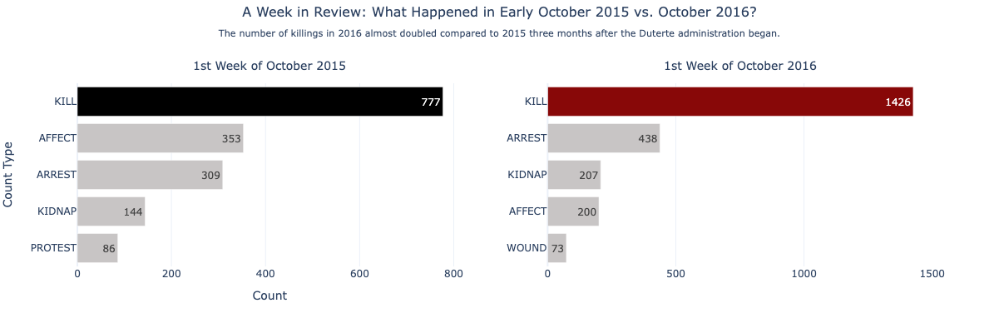

In [11]:
# Sorting and extracting the maximum count for 2015
result_asc_2015 = result_2015.sort_values(by="count", ascending=True)
max_count_2015 = result_asc_2015["count"].max()
colors_2015 = ["#C8C5C5" if count != max_count_2015 else '#000000'
               for count in result_asc_2015["count"]]

# Sorting and extracting the maximum count for 2016
result_asc_2016 = result.sort_values(by="count", ascending=True)
max_count_2016 = result_asc_2016["count"].max()
colors_2016 = ["#C8C5C5" if count != max_count_2016 else '#880808'
               for count in result_asc_2016["count"]]

# Creating a subplot with two plots side by side
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=("1st Week of October 2015",
                                    "1st Week of October 2016"))

# Adding the 2015 bar chart to the first subplot
fig.add_trace(
    go.Bar(
        y=result_asc_2015["CountType"],
        x=result_asc_2015["count"],
        marker=dict(color=colors_2015),
        text=result_asc_2015["count"],
        orientation='h',
        showlegend=False
    ),
    row=1, col=1
)

# Adding the 2016 bar chart to the second subplot
fig.add_trace(
    go.Bar(
        y=result_asc_2016["CountType"],
        x=result_asc_2016["count"],
        marker=dict(color=colors_2016),
        text=result_asc_2016["count"],
        orientation='h',
        showlegend=False
    ),
    row=1, col=2
)

# Updating layout properties for both subplots
fig.update_layout(
    title={
        'text': (
            "A Week in Review: What Happened in Early October 2015 vs. "
            "October 2016?<br>"
            "<sub>The number of killings in 2016 almost doubled compared to "
            "2015 three months after the Duterte administration began.</sub>"
        ),
        'y': 0.95,  # Adjusts the vertical alignment of the title
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'pad': {'b': 20}  # Adjusts the padding below the title
    },
    title_font_size=16,
    xaxis_title="Count",
    yaxis_title="Count Type",
    width=1000,
    height=400,
    template="plotly_white",
    annotations=[
        {
            "font": {"size": 14},
            "x": 0.225,
            "y": 1.05,
            "showarrow": False,
            "text": "1st Week of October 2015",
            "xref": "paper", "yref": "paper"
        },
        {
            "font": {"size": 14},
            "x": 0.775,
            "y": 1.05,
            "showarrow": False,
            "text": "1st Week of October 2016",
            "xref": "paper", "yref": "paper"
        }
    ]
)

# Adjusting the subplot titles
fig.update_xaxes(title_text="Count", row=1, col=1)
fig.update_yaxes(title_text="Count Type", row=1, col=1)

# Display the combined plot
fig.show()

<center><small><b>Figure X.</b> Number of Kills CountType in 2016 nearly doubled compared to 2015. </small></center>

As it turns out, when compared to the same week of last year (2015), the <b style='color:#880808'>number of killings almost doubled three months after the Duterte Administration began</b>. The rise in the number of arrests could also be indicative of <b style='color:#880808'>more aggressive law enforcement</b> or changes in policing strategies.

Still, these possibilities are all that they are—possibilities. The GDELT Project describes the `KILL` count type as *any mention of something dying*. This renders our analysis limited and premature without more information on what the `KILL`-type documents, or documents of any other type, are all about.

Lucky for us, the GKG dataset includes information on the themes of the report, and it's quite comprehensive too.

<div style="background-color:#880808 ; padding: 10px 0;">
    <center><h5 style="color: white; font-weight:bold">Which themes are associated with documents that have a <code>KILL</code> count type?</h3></center>
</div> 

In the dataset, a single document can be tagged with multiple themes. For example, consider this [report](https://catholicphilly.com/2016/10/news/world-news/philippine-bishops-leader-in-endless-grief-over-drug-war/) from the GKG dataset, which is classified under the "KILL" count type.

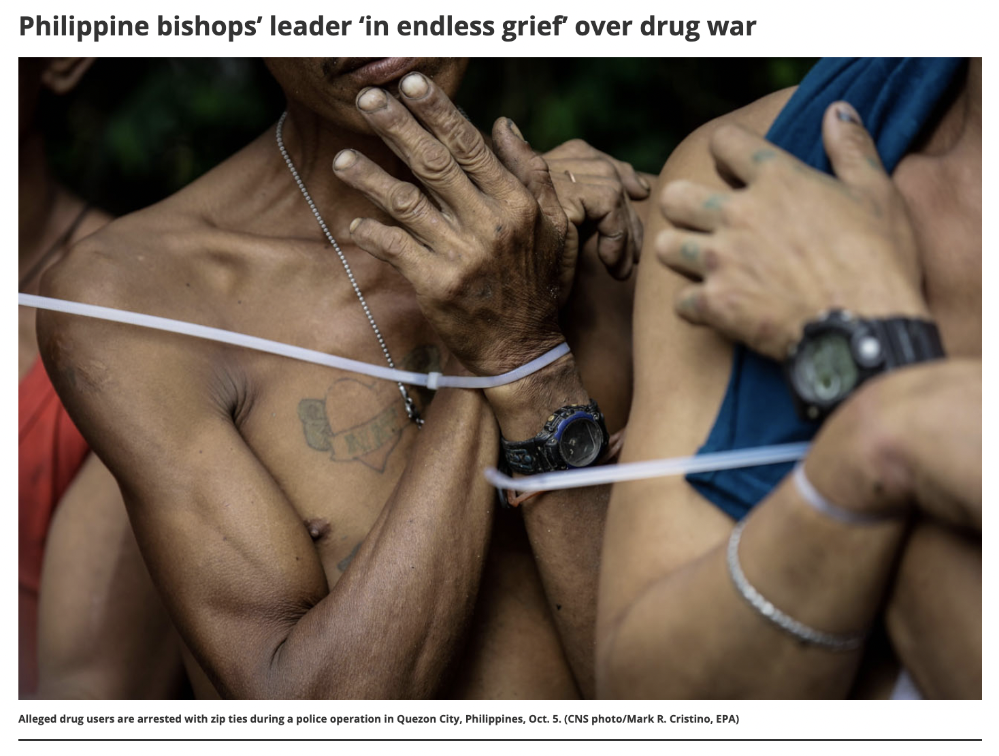
<center><small><b>Figure X.</b> Sample document from the GKG dataset, taken from Catholic News Service (2016)</small></center>

This document is tagged with themes such as:

    DRUG_TRADE;WB_1331_HEALTH_TECHNOLOGIES;WB_2453_ORGANIZED_CRIME;WB_1350_PHARMACEUTICALS;WB_2433_CONFLICT_AND_VIOLENCE;WB_621_HEALTH_NUTRITION_AND_POPULATION;WB_2432_FRAGILITY_CONFLICT_AND_VIOLENCE;WB_2456_DRUGS_AND_NARCOTICS;ARMEDCONFLICT;

Even without a detailed review of the article itself, it's clear that the primary focus is on drugs and violence. In fact, the predominant themes of "KILL"-related documents are:

In [12]:
result = (df_ph
          .withColumn('Theme', F.explode('Themes_List'))
          .filter((F.col('CountType') == 'KILL') &
                  (F.col('Country') == 'Philippines') &
                  (~F.col('Theme').startswith('TAX')) &
                  (F.col('Theme') != 'KILL') &
                  (F.col('Theme') != '')
                 )
          .groupBy('Theme')
          .count()
          .orderBy('count', ascending=False)
          .limit(10)
         )
# result

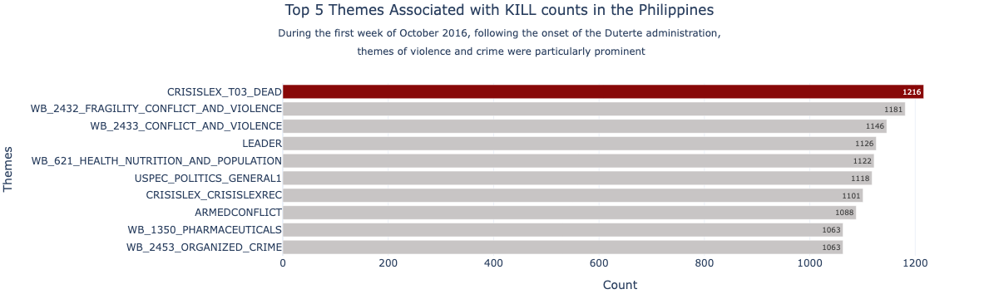

In [13]:
# Create the bar graph with Plotly in horizontal orientation
# Sorting and extracting the maximum count for highlighting
result_sorted = result.toPandas().sort_values(by="count", ascending=True)
max_count = result_sorted["count"].max()

# Define colors for each bar, highlighting the highest one
colors = ["#C8C5C5" if count != max_count else '#880808'
          for count in result_sorted["count"]]

# Create the bar graph with Plotly in horizontal orientation
fig = go.Figure(
    go.Bar(
        x=result_sorted['count'],  # Set the counts on the x-axis
        y=result_sorted['Theme'],  # Set the themes on the y-axis
        text=result_sorted['count'],
        textposition='auto',
        orientation='h',  # Make the bar chart horizontal
        marker=dict(color=colors)  # Customize the colors
    )
)

# Customize the layout
fig.update_layout(
    title={
        'text': (
            "Top 5 Themes Associated with KILL counts in the Philippines<br>"
            "<sub>During the first week of October 2016, following the onset "
            "of the Duterte administration,<br> themes of violence and crime "
            "were particularly prominent</sub>"
        ),
        'y': 0.95,  # Adjusts the vertical alignment of the title
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'pad': {'b': 20}
    },
    xaxis_title="Count",
    yaxis_title="Themes",
    template="plotly_white",
    margin=dict(l=50, r=50, t=100, b=50), 
)

# Show the plot
fig.show()

<center><small><b>Figure X.</b> CRISISLEX_T03 leads the Themes associated with KILL counts in the Philippines. </small></center>

Compared to 2015, there is an apparent difference in the themes of broadcasted news and other online discussions in 2016. Specifically, the data shows a significant increase in reports related to violence and crime following the onset of the Duterte administration. The "CRISISLEX_T03_DEAD" theme, associated with reports of deaths, saw the highest increase, with 1,216 mentions in the first week of October 2016, compared to 664 mentions in the same period of 2015.

Other themes such as "WB_2432_FRAGILITY_CONFLICT_AND_VIOLENCE" and "WB_2433_CONFLICT_AND_VIOLENCE" also saw substantial increases, with 1,181 and 1,146 mentions respectively in 2016. These themes indicate heightened attention to issues of fragility and conflict, reflecting the turbulent environment during the Duterte administration's early months. The government's hardline policies towards illegal drug trade and the consequential social unrest have likely contributed to the increased focus on these themes.

Notably, the theme "LEADER" appeared with 1,126 mentions in 2016 but was absent in 2015, suggesting increased focus on leadership-related discussions. This shift could be linked to the new administration's leadership style and policy decisions, which have sparked extensive debate and media coverage. Similarly, the theme "WB_621_HEALTH_NUTRITION_AND_POPULATION" was prominent in 2016 with 1,122 mentions, compared to its absence in 2015, possibly reflecting increased concerns about public health and population issues amidst the administration's controversial policies.

Other emerging themes in 2016, such as "USPEC_POLITICS_GENERAL1" and "ARMEDCONFLICT," with 1,118 and 1,088 mentions respectively, further underscore the significant changes in the socio-political landscape under the Duterte administration. These themes highlight the broader political dynamics and instances of armed conflict that have become more pronounced in the media and public discourse during this period.

In [14]:
result_2015 = (df_ph_2015
               .withColumn('Theme', F.explode('Themes_List'))
               .filter((F.col('CountType') == 'KILL') &
                       (F.col('Country') == 'Philippines') &
                       (~F.col('Theme').startswith('TAX')) & 
                       ((F.col('Theme') != '')) &
                       (F.col('Theme') != 'KILL')
                      )
               .groupBy('Theme')
               .count()
               .orderBy('count', ascending=False)
               .limit(10)
              )

In [15]:
# # Sorting and extracting the maximum count for 2015
# result_asc_2015 = result_2015.toPandas().sort_values(by="count", ascending=True)
# max_count_2015 = result_asc_2015["count"].max()
# colors_2015 = ["#C8C5C5" if count != max_count_2015 else '#000000'
#                for count in result_asc_2015["count"]]

# # Sorting and extracting the maximum count for 2016
# result_asc_2016 = result.toPandas().sort_values(by="count", ascending=True)
# max_count_2016 = result_asc_2016["count"].max()
# colors_2016 = ["#C8C5C5" if count != max_count_2016 else '#880808'
#                for count in result_asc_2016["count"]]

# # Creating a subplot with two plots side by side
# fig = make_subplots(
#     rows=1, cols=2,
#     subplot_titles=("1st Week of October 2015", "1st Week of October 2016"),
#     horizontal_spacing=0.15
# )

# # Adding the 2015 bar chart to the first subplot
# fig.add_trace(
#     go.Bar(
#         y=result_asc_2015["Theme"],
#         x=result_asc_2015["count"],
#         marker=dict(color=colors_2015),
#         text=result_asc_2015["count"],
#         orientation='h',
#         showlegend=False
#     ),
#     row=1, col=1
# )

# # Adding the 2016 bar chart to the second subplot with bars facing left
# fig.add_trace(
#     go.Bar(
#         y=result_asc_2016["Theme"],
#         x=-result_asc_2016["count"],  # Make the x values negative
#         marker=dict(color=colors_2016),
#         text=result_asc_2016["count"],
#         orientation='h',
#         showlegend=False
#     ),
#     row=1, col=2
# )

# # Updating layout properties for both subplots
# fig.update_layout(
#     title={
#         'text': (
#             "Top 5 Themes Associated with KILL counts in the Philippines<br>"
#             "<sub>Comparison Between the First Week of October 2015 and "
#             "2016</sub>"
#         ),
#         'y': 0.95,  # Adjusts the vertical alignment of the title
#         'x': 0.5,
#         'xanchor': 'center',
#         'yanchor': 'top',
#         'pad': {'b': 10}  # Adjusts the padding below the title
#     },
#     title_font_size=16,
#     xaxis_title="Count",
#     yaxis_title="Theme",
#     margin=dict(t=110),
#     width=1000,
#     height=400,
#     template="plotly_white",
#     annotations=[
#         {
#             "font": {"size": 14},
#             "x": 0.225,
#             "y": 1.05,
#             "showarrow": False,
#             "text": "1st Week of October 2015",
#             "xref": "paper", "yref": "paper"
#         },
#         {
#             "font": {"size": 14},
#             "x": 0.775,
#             "y": 1.05,
#             "showarrow": False,
#             "text": "1st Week of October 2016",
#             "xref": "paper", "yref": "paper"
#         }
#     ]
# )

# fig.update_xaxes(title_text="Count", tickfont=dict(size=10), row=1, col=1)
# fig.update_xaxes(title_text="Count", tickfont=dict(size=10), row=1, col=2,
#                  tickvals=[-1600, -1400, -1200, -1000, 0],
#                  ticktext=["1600", "1400", "1200", "1000", "0"])
# fig.update_yaxes(title_text="Theme", tickfont=dict(size=10), row=1, col=1)
# fig.update_yaxes(title_text="Theme", side="right", tickfont=dict(size=10),
#                  row=1, col=2)

# # Display the combined plot
# fig.show()

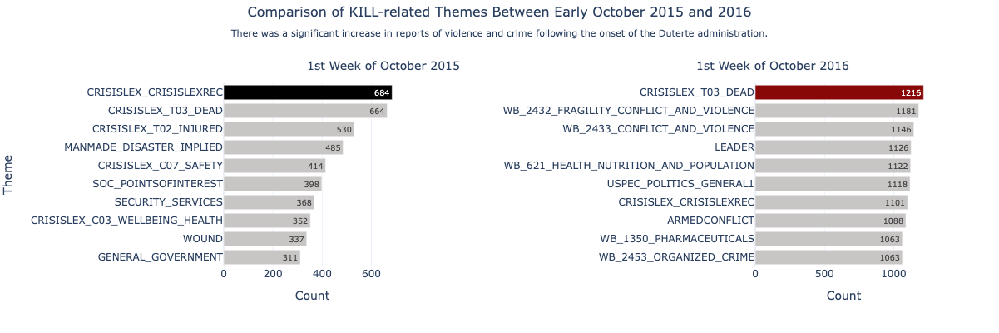

In [16]:
# Sorting and extracting the maximum count for 2015
result_asc_2015 = result_2015.toPandas().sort_values(by="count", ascending=True)
max_count_2015 = result_asc_2015["count"].max()
colors_2015 = ["#C8C5C5" if count != max_count_2015 else '#000000'
               for count in result_asc_2015["count"]]

# Sorting and extracting the maximum count for 2016
result_asc_2016 = result.toPandas().sort_values(by="count", ascending=True)
max_count_2016 = result_asc_2016["count"].max()
colors_2016 = ["#C8C5C5" if count != max_count_2016 else '#880808'
               for count in result_asc_2016["count"]]

# Creating a subplot with two plots side by side
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("1st Week of October 2015", "1st Week of October 2016"),
    horizontal_spacing=0.5  # Adjust this value to increase spacing
)

# Adding the 2015 bar chart to the first subplot
fig.add_trace(
    go.Bar(
        y=result_asc_2015["Theme"],
        x=result_asc_2015["count"],
        marker=dict(color=colors_2015),
        text=result_asc_2015["count"],
        orientation='h',
        showlegend=False
    ),
    row=1, col=1
)

# Adding the 2016 bar chart to the second subplot
fig.add_trace(
    go.Bar(
        y=result_asc_2016["Theme"],
        x=result_asc_2016["count"],
        marker=dict(color=colors_2016),
        text=result_asc_2016["count"],
        orientation='h',
        showlegend=False
    ),
    row=1, col=2
)

# Updating layout properties for both subplots
fig.update_layout(
    title={
        'text': (
            "Comparison of KILL-related Themes Between Early October 2015 and "
            "2016<br>"
            "<sub>There was a significant increase in reports of violence and "
            "crime following the onset of the Duterte administration.</sub>"
        ),
        'y': 0.95,  # Adjusts the vertical alignment of the title
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'pad': {'b': 20}  # Adjusts the padding below the title
    },
    title_font_size=16,
    xaxis_title="Count",
    yaxis_title="Theme",
    margin=dict(t=100),
    width=1000,
    height=400,
    template="plotly_white",
    annotations=[
        {
            "font": {"size": 14},
            "x": 0.225,
            "y": 1.05,
            "showarrow": False,
            "text": "1st Week of October 2015",
            "xref": "paper", "yref": "paper"
        },
        {
            "font": {"size": 14},
            "x": 0.775,
            "y": 1.05,
            "showarrow": False,
            "text": "1st Week of October 2016",
            "xref": "paper", "yref": "paper"
        }
    ]
)

# Adjusting the subplot titles
fig.update_xaxes(title_text="Count", row=1, col=1)
fig.update_xaxes(title_text="Count", row=1, col=2)

# Display the combined plot
fig.show()

<center><small><b>Figure X.</b> Nearly doubled counts for themes associated with kill in comparison to 2015 and 2016.</small></center>

<div style="background-color:#880808 ; padding: 10px 0;">
    <center><h5 style="color: white; font-weight:bold">Which objects are associated with documents that have <code>KILL</code> CountType? </h3></center>
</div> 

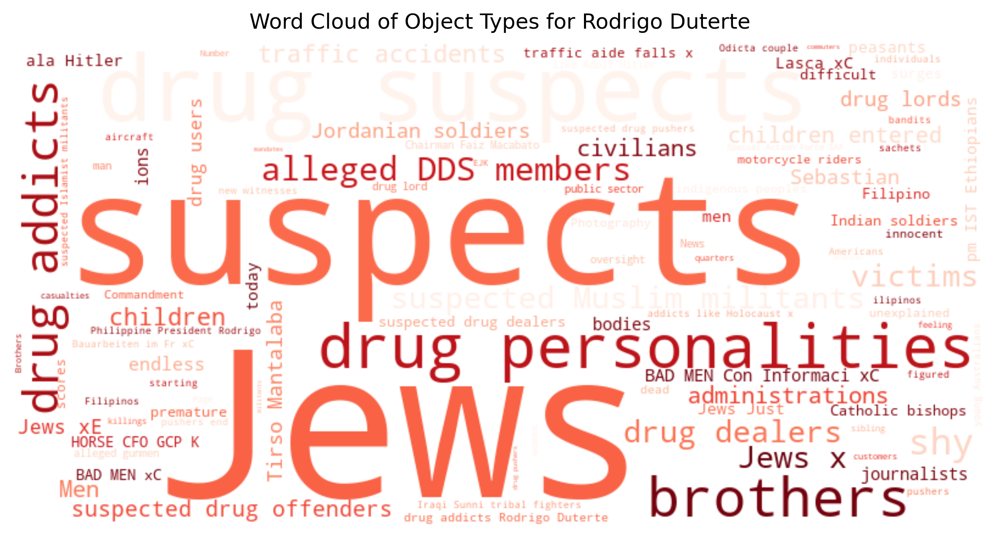

In [38]:
result = (df_ph
          .withColumn('Person', F.explode('Persons_List'))
          # .filter(F.col('Person') == 'rodrigo duterte')
          .withColumn('Object', F.split(F.col('V1COUNTS'), '#').getItem(2))
          .filter((F.col('Object').isNotNull()) &
                  (F.col('Object') != "") &
                  (F.col('CountType') == 'KILL')
                 )
          .groupBy('Object')
          .count()
          .orderBy('count', ascending=False)
         )

pdf_result = result.toPandas()

# Prepare data for word cloud
word_freq = dict(zip(pdf_result['Object'],
                     pdf_result['count']))

color_func = lambda *args, **kwargs: "#880808"

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white',
                      colormap='Reds_r', random_state=26).generate_from_frequencies(word_freq)

# Display the word cloud
plt.figure(figsize=(10, 5), dpi=300)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Object Types for Rodrigo Duterte')
plt.show()

<center><small><b>Figure X.</b> Word Cloud of objects associated with 'KILL' CountType in 2016.</small></center>

The WordCloud displayed common words associated with news about killings, such as suspects and victims. However, many of the words also had connections to illegal drugs, like dealers and addicts. Surprisingly, the largest word in the cloud was "Jews."
Upon researching, it was discovered that this was in reference to a statement made by Rodrigo Duterte during an interview. He compared his war on drugs to Hitler's genocide against the Jewish people. (insert ref) This sparked outrage and condemnation globally. Rodrigo Duterte's controversial statement drew intense criticism and backlash from nations, organizations, and human rights groups around the world. (insert ref)

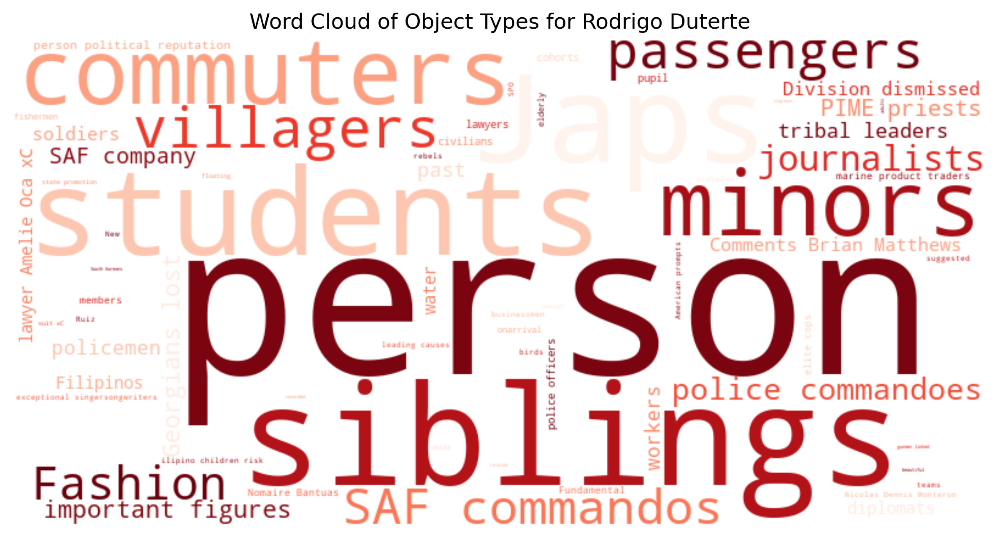

In [39]:
result = (df_ph_2015
          .withColumn('Person', F.explode('Persons_List'))
          # .filter(F.col('Person') == 'rodrigo duterte')
          .withColumn('Object', F.split(F.col('V1COUNTS'), '#').getItem(2))
          .filter((F.col('Object').isNotNull()) &
                  (F.col('Object') != "") &
                  (F.col('CountType') == 'KILL')
                 )
          .groupBy('Object')
          .count()
          .orderBy('count', ascending=False)
         )

pdf_result = result.toPandas()

# Prepare data for word cloud
word_freq = dict(zip(pdf_result['Object'],
                     pdf_result['count']))

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white',
                      colormap='Reds_r', random_state=26).generate_from_frequencies(word_freq)

# Display the word cloud
plt.figure(figsize=(10, 5), dpi=300)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Object Types for Rodrigo Duterte')
plt.show()

<center><small><b>Figure X.</b> Word Cloud of objects associated with 'KILL' CountType in 2015.</small></center>

Comparing this word cloud from 2015 to the previous one, the difference is night and day. The words in the 2015 word cloud are not associated with drugs at all.

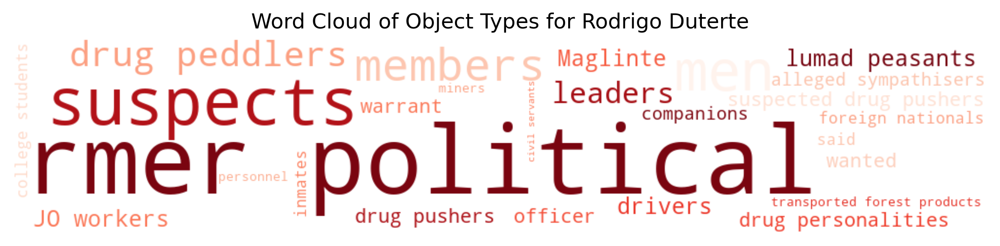

In [40]:
result = (df_ph_2015
          .withColumn('Person', F.explode('Persons_List'))
          # .filter(F.col('Person') == 'rodrigo duterte')
          .withColumn('Object', F.split(F.col('V1COUNTS'), '#').getItem(2))
          .filter((F.col('Object').isNotNull()) &
                  (F.col('Object') != "") &
                  (F.col('CountType') == 'ARREST')
                 )
          .groupBy('Object')
          .count()
          .orderBy('count', ascending=False)
         )

pdf_result = result.toPandas()

# Prepare data for word cloud
word_freq = dict(zip(pdf_result['Object'],
                     pdf_result['count']))

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=200, background_color='white',
                      colormap='Reds_r', random_state=26).generate_from_frequencies(word_freq)

# Display the word cloud
plt.figure(figsize=(10, 5), dpi=300)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Object Types for Rodrigo Duterte')
plt.show()

Our observations so far suggest that the nature of news and discussions in the Philippines drastically changed with the ascension of the Duterte Administration to power. 

But to further substantiate this interpretation, we have to paint a picture of the global landscape to determine whether this shift results from new political leadership or is simply a consequence of global trends.

For this purpose, we will narrow our focus to countries neighboring the Philippines, specifically in Southeast Asia.

Previously, we found that the number of "KILL"-related discussions nearly doubled from 2015 to 2016 during the first week of October in the Philippines. To provide a broader perspective and assess the significance of this finding, let's examine how this figure compares to the corresponding numbers in neighboring countries of the Philippines during the same period. Additionally, we'll investigate how the Philippines compares to its neighbors in other count types.

In [20]:
# Retrieve all 'CountType' values in the Philippines dataset and count 
# occurrences per type
result = (df_ph
          .filter(F.col('CountType').isNotNull())
          .groupBy('CountType')
          .count()
          .orderBy('count', ascending=False)
          .toPandas()
         )

# Extract the unique 'CountType' values into a list
list_counttype_ph = result['CountType'].to_list()
dataframes = {}  # Dictionary to store DataFrames
for ct in list_counttype_ph:
    dataframes[ct] = df_sea_ph.filter(F.col('CountType').rlike(ct))

# Initialize a dictionary to hold the pandas DataFrames
pandas_dfs = {}
for ct, df in dataframes.items():
    grouped_df = (df
                  .filter(F.col('Country').isNotNull())
                  .groupBy('Country')
                  .count()
                  .orderBy('count', ascending=False)
                 )
    # Store the resulting pandas DataFrame in the dictionary
    pandas_dfs[ct] = grouped_df

In [21]:
# for i, j in pandas_dfs.items():
#     # Convert to Pandas DataFrame
#     result = j.toPandas()

#     # Sort by 'count' in descending order to show the most frequent at the top
#     result = result.sort_values(by='count', ascending=True)

#     # Extract the max count for reference
#     max_count = result['count'].max()

#     # Define colors, setting the Philippines to red and all others to gray
#     colors = ['#880808' if country == 'Philippines' else 'gray'
#               for country in result['Country']]

#     # Initialize the figure
#     fig = go.Figure()

#     # Add a horizontal bar trace with dynamic colors
#     fig.add_trace(go.Bar(
#         x=result['count'],
#         y=result['Country'],
#         marker=dict(color=colors),
#         text=result['count'],
#         orientation='h',
#         showlegend=False
#     ))

#     # Set titles and labels
#     fig.update_layout(
#         title=(f"A Week in Review: Count of {i} CountType "
#                "in Early October 2016 in SEA Countries<br>"),
#         title_font_size=16,
#         xaxis_title='Count',
#         yaxis_title='Country',
#         width=700,
#         height=500,
#         template='plotly_white'
#     )

#     # Show the plot
#     fig.show()


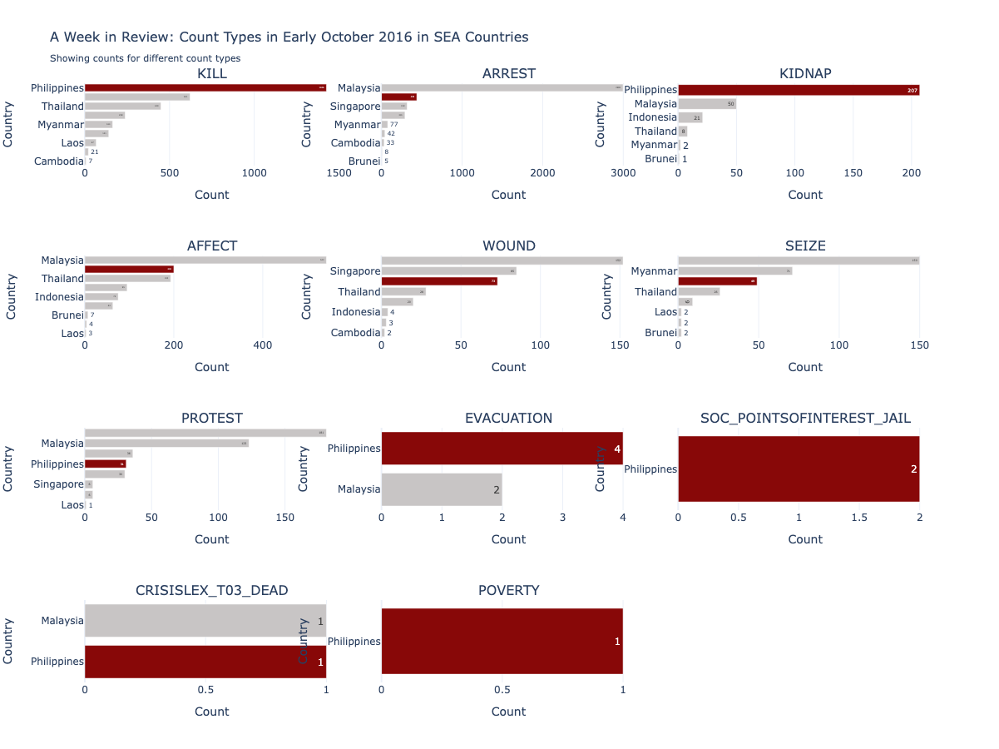

In [22]:
# Determine the new grid size (3 rows, 4 columns)
rows, cols = 4, 3

# Create subplot titles for each count type
subplot_titles = [f"{ct}" for ct in pandas_dfs.keys()]

# Initialize subplots with the new grid and increased spacing
fig = make_subplots(
    rows=rows,
    cols=cols,
    subplot_titles=subplot_titles,
    vertical_spacing=0.15,  # Adjust to increase vertical spacing
    horizontal_spacing=0.05  # Adjust to increase horizontal spacing
)

# Loop over each count type and its DataFrame
for idx, (ct, df) in enumerate(pandas_dfs.items()):
    # Convert to Pandas DataFrame
    result = df.toPandas()

    # Sort by 'count' in ascending order to display the most frequent at the top
    result = result.sort_values(by='count', ascending=True)

    # Define colors, setting the Philippines to red and all others to gray
    colors = ['#880808' if country == 'Philippines' else '#C8C5C5'
              for country in result['Country']]

    # Determine the subplot row and column indices
    row = idx // cols + 1
    col = idx % cols + 1

    # Add a horizontal bar trace with dynamic colors to the appropriate subplot
    fig.add_trace(
        go.Bar(
            x=result['count'],
            y=result['Country'],
            marker=dict(color=colors),
            text=result['count'],
            orientation='h',
            showlegend=False
        ),
        row=row, col=col
    )

# Set the overall plot layout
fig.update_layout(
    title=(
        "A Week in Review: Count Types in Early October 2016 in SEA Countries<br>"
        "<sub>Showing counts for different count types</sub>"
    ),
    title_font_size=16,
    width=1200,
    height=900,
    template='plotly_white'
)

# Adjust individual subplot axis titles
for idx in range(1, rows * cols + 1):
    fig.update_xaxes(title_text='Count', row=(idx - 1) // cols + 1, col=(idx - 1) % cols + 1)
    fig.update_yaxes(title_text='Country', row=(idx - 1) // cols + 1, col=(idx - 1) % cols + 1)

# Show the final grid plot
fig.show()

Out of all the different countries in SEA, Philippines ranked 1 for kill during this time period. Looking this in contrast to arrest, Philippines ranked number 2, while in Malaysia there were 2998 counts.


xxxxxx

<div style="background-color:#880808 ; padding: 10px 0;">
    <center><h5 style="color: white; font-weight:bold">more 2016 xxx</h3></center>
</div> 

In [23]:
result = (df_sea_ph
          .withColumn("overall_tone",
                      F.split(F.col("`V1.5TONE`"), ",")
                      .getItem(0).cast("float")
                     )
          .withColumn("pos_tone", F.split(F.col("`V1.5TONE`"), ",")
                      .getItem(1).cast("float")
                     )
          .withColumn("neg_tone", F.split(F.col("`V1.5TONE`"), ",")
                      .getItem(2).cast("float")
                     )
          .groupBy('Country')
          .agg(F.mean('overall_tone').alias('mean_overall_tone'),
               F.mean('pos_tone').alias("mean_pos_tone"),
               F.mean('neg_tone').alias("mean_neg_tone")
              )
          .orderBy('mean_overall_tone')
         )

result_2015 = (df_sea_ph_2015
               .withColumn("overall_tone",
                           F.split(F.col("`V1.5TONE`"), ",")
                           .getItem(0).cast("float")
                          )
               .withColumn("pos_tone", F.split(F.col("`V1.5TONE`"), ",")
                           .getItem(1).cast("float")
                          )
               .withColumn("neg_tone", F.split(F.col("`V1.5TONE`"), ",")
                           .getItem(2).cast("float")
                          )
               .groupBy('Country')
               .agg(F.mean('overall_tone').alias('mean_overall_tone'),
                    F.mean('pos_tone').alias("mean_pos_tone"),
                    F.mean('neg_tone').alias("mean_neg_tone")
                   )
               .orderBy('mean_overall_tone')
              )

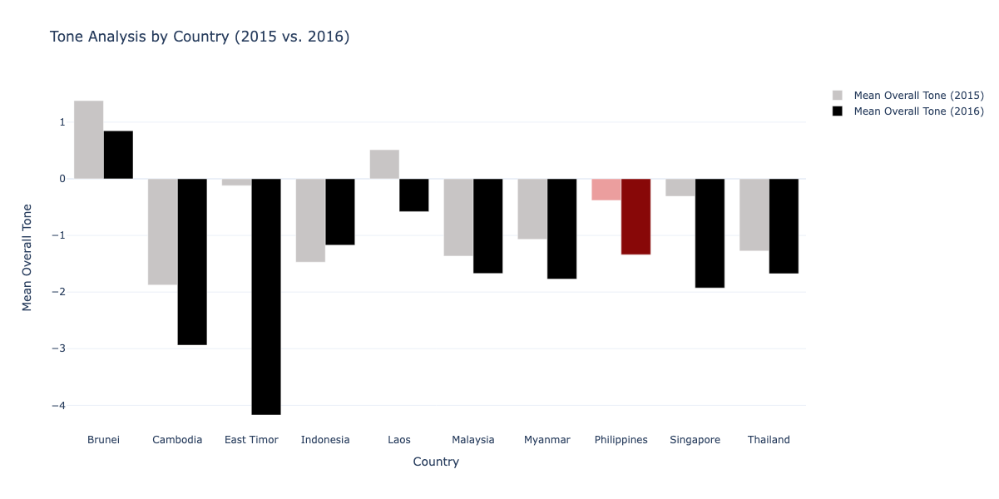

In [24]:
# Convert Spark DataFrames to Pandas
df_2016 = result.toPandas()
df_2015 = result_2015.toPandas()

# Ensure both dataframes are sorted by country (if not already sorted)
df_2016 = df_2016.sort_values(by='Country')
df_2015 = df_2015.sort_values(by='Country')

# Functions to apply conditional coloring
def get_2016_colors(df, highlight_country='Philippines',
                    highlight_color='#880808', default_color='black'):
    return [highlight_color if country == highlight_country else default_color
            for country in df['Country']]

def get_2015_colors(df, highlight_country='Philippines',
                    highlight_color='#EB9E9E', default_color='#C8C5C5'):
    return [highlight_color if country == highlight_country else default_color
            for country in df['Country']]

# Create the figure
fig = go.Figure()


# Add the 2015 bar trace with conditional coloring
fig.add_trace(go.Bar(
    x=df_2015['Country'],
    y=df_2015['mean_overall_tone'],
    name='Mean Overall Tone (2015)',
    marker_color=get_2015_colors(df_2015)
))

# Add the 2016 bar trace with conditional coloring
fig.add_trace(go.Bar(
    x=df_2016['Country'],
    y=df_2016['mean_overall_tone'],
    name='Mean Overall Tone (2016)',
    marker_color=get_2016_colors(df_2016)
))


# Update layout for grouped bar chart
fig.update_layout(
    title='Tone Analysis by Country (2015 vs. 2016)',
    xaxis_title='Country',
    yaxis_title='Mean Overall Tone',
    barmode='group',
    width=1000, height=600,
    template='plotly_white'
)

# Show the plot
fig.show()

<div style="background-color:#880808 ; padding: 10px 0;">
    <center><h5 style="color: white; font-weight:bold">more 2016 xxx</h3></center>
</div> 

In [36]:
result = (df_ph
           .withColumn('Person', F.explode(F.col('Persons_List')))
           .groupBy('Person')
           .count()
           .orderBy('count', ascending=False)
          )

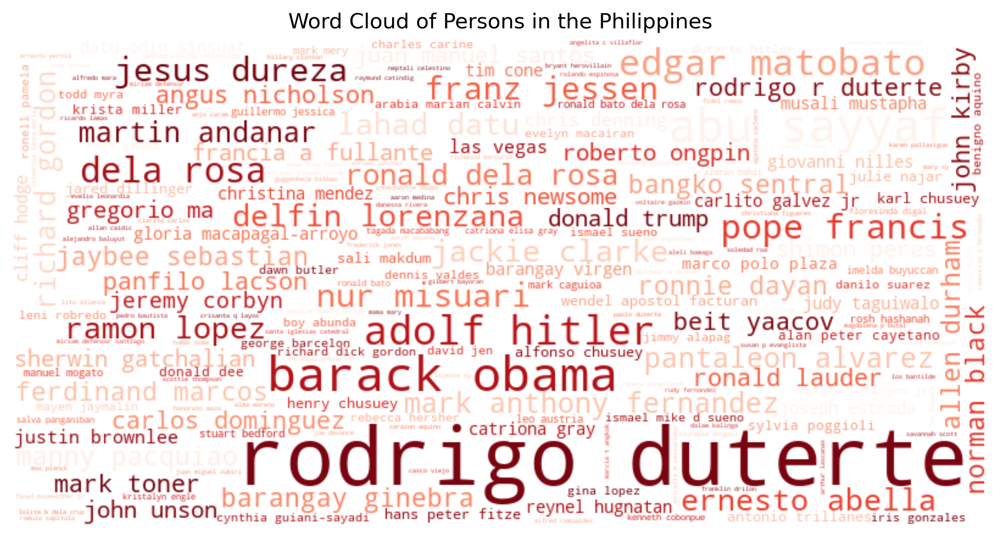

In [37]:
pdf_ph_persons_counts = result.toPandas()

# Prepare data for word cloud
word_freq = dict(zip(pdf_ph_persons_counts['Person'],
                     pdf_ph_persons_counts['count']))

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white',
                      colormap='Reds_r', random_state=26).generate_from_frequencies(word_freq)

# Display the word cloud
plt.figure(figsize=(10, 5), dpi=250)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Persons in the Philippines')
plt.show()

<div style="background-color:#880808 ; padding: 10px 0;">
    <center><h5 style="color: white; font-weight:bold">more 2016 xxx</h3></center>
</div> 

In [27]:
# For the plot below
result = (df_sea_ph
          .filter(F.col('Country') == 'Philippines')
          .withColumn('Theme', F.explode(F.col('Themes_List')))
          .withColumn('Person', F.explode(F.col('Persons_List')))
          .filter(F.col('Person') == 'rodrigo duterte')
          .filter(F.col('Theme') != "")
          .groupBy('Theme')
          .count()
          .filter(~F.col('Theme').startswith('TAX'))
          .orderBy('count', ascending=False)
          .limit(10)
         )

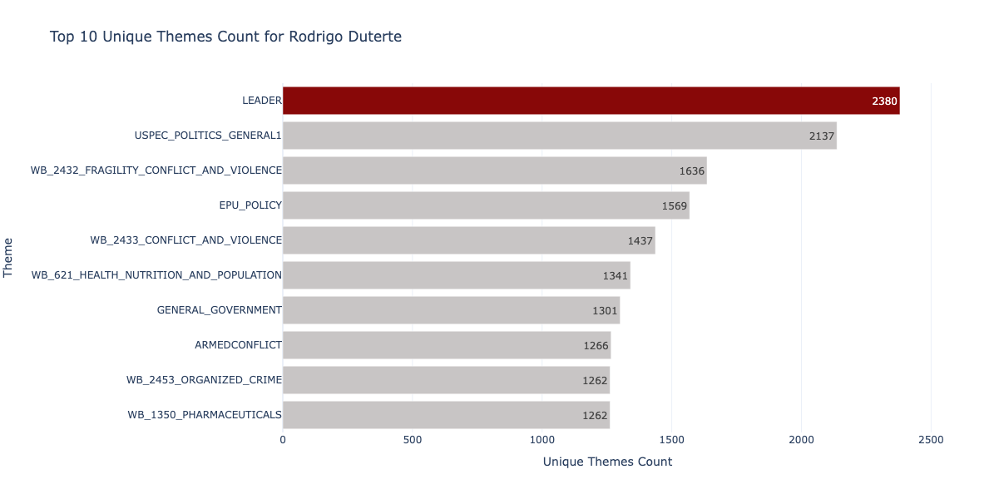

In [28]:
# Convert to pandas DataFrame and sort
pdf_duterte_themes = result.toPandas().sort_values('count',
                                                   ascending=False)

# Determine the maximum count
max_count = pdf_duterte_themes['count'].max()

# Define colors, highlighting only the maximum count theme
colors = ['#880808' if count == max_count else '#C8C5C5'
          for count in pdf_duterte_themes['count']]


# Initialize the figure
fig = go.Figure()

# Add a bar trace
fig.add_trace(go.Bar(
    x=pdf_duterte_themes['count'],
    y=pdf_duterte_themes['Theme'],
    orientation='h',
    marker=dict(color=colors),
    text=pdf_duterte_themes['count']
))

# Update layout
fig.update_layout(
    title='Top 10 Unique Themes Count for Rodrigo Duterte',
    xaxis_title='Unique Themes Count',
    yaxis_title='Theme',
    yaxis=dict(categoryorder='total ascending'),
    width=1000, height=600,
    template='plotly_white'
)

# Show the plot
fig.show()

<div style="background-color:#000000 ; padding: 10px 0;">
    <center><h1 style="color: white; font-weight:bold">RESULTS AND DISCUSSION</h1></center>
</div> 

<div style="background-color:#000000 ; padding: 10px 0;">
    <center><h1 style="color: white; font-weight:bold">RECOMMENDATIONS</h1></center>
</div> 

For future research, it is recommended to explore a more extensive dataset covering additional years to uncover trends over a longer time period. The analysis could be refined by focusing on top countries to identify prevalent events and concerns, and contrasting these with an analysis of bottom countries based on GDP, although GDP data would need to be sourced externally. A more comprehensive analysis could be achieved by supplementing the existing data with additional information such as geographical coordinates, supported by tools like Nominatim or OpenStreetMap (OSM) data. This approach would enhance the depth and scope of the insights derived from the analysis. 

<div style="background-color:#000000 ; padding: 10px 0;">
    <center><h1 style="color: white; font-weight:bold">SCOPE & LIMITATIONS</h1></center>
</div> 

The scope of this study is focused and acknowledges certain limitations due to constraints in time and computational resources. The analysis covered data from a one-week period, three months after Rodrigo Duterte's inauguration. For comparative purposes, data spanning a year before this period was examined. Additionally, the study will include data from other Southeast Asian (SEA) countries to provide a broader regional context for comparison. These constraints are necessary to ensure the feasibility of the analysis within the given timeframe and available resources. 

<div style="background-color:#000000 ; padding: 10px 0;">
    <center><h1 style="color: white; font-weight:bold">CONCLUSION</h1></center>
</div>

<div style="background-color:#000000 ; padding: 10px 0;">
    <center><h1 style="color: white; font-weight:bold">REFERENCES</h1></center>
</div> 

The GDELT Project. (n.d.). [Web page]. Retrieved from https://www.gdeltproject.org/

Channel News Asia. (2022). Paid troll army for hire: Philippines' social media elections influencers. [Web page]. Channel News Asia. Retrieved from https://www.channelnewsasia.com/cna-insider/paid-troll-army-hire-philippines-social-media-elections-influencers-2917556

Rappler. (n.d.). Investigating troll farms: What to look out for. [Web page]. Retrieved from https://www.rappler.com/newsbreak/iq/investigating-troll-farms-what-to-look-out-for

https://catholicphilly.com/2016/10/news/world-news/philippine-bishops-leader-in-endless-grief-over-drug-war/

https://carnegieendowment.org/research/2019/01/philippine-politics-under-duterte-a-midterm-assessment?lang=en

https://www.independent.co.uk/news/world/asia/philippines-president-rodrigo-duterte-tells-people-to-go-ahead-and-kill-drug-addicts-a7116456.html

https://www.rappler.com/nation/142210-duterte-list-lgu-police-officials-linked-drugs/

https://www.bloomberg.com/news/features/2017-12-07/how-rodrigo-duterte-turned-facebook-into-a-weapon-with-a-little-help-from-facebook

https://www.bbc.com/news/world-asia-50236481

https://www.philstar.com/headlines/2018/09/24/1854162/78-pinoys-satisfied-drug-war-sws

https://pco.gov.ph/december-19-2016-news-releases/

https://carnegieendowment.org/research/2019/01/philippine-politics-under-duterte-a-midterm-assessment?lang=en

<div style="background-color:BLUE ; padding: 10px 0;">
    <center><h1 style="color: white; font-weight:bold">SCRATCH</h1></center>
</div> 

In [1]:
import os
from pyspark.sql import SparkSession
from pyspark.sql import functions as F

In [2]:
spark = (SparkSession
     .builder
     .master('local[*]') # Master URL;
     .getOrCreate())

In [3]:
from pyspark.sql.types import (StructType, StructField, StringType,
IntegerType, FloatType, TimestampType, LongType)
import glob
# Define the schema—NOT FINAL; SHOULD REVISIT
schema = StructType([
    StructField("GKGRECORDID", StringType(), True),
    StructField("V2.1DATE", LongType(), True),
    StructField("V2SOURCECOLLECTIONIDENTIFIER", IntegerType(), True),
    StructField("V2SOURCECOMMONNAME", StringType(), True),
    StructField("V2DOCUMENTIDENTIFIER", StringType(), True),
    StructField("V1COUNTS", StringType(), True),
    StructField("V2.1COUNTS", StringType(), True),
    StructField("V1THEMES", StringType(), True),
    StructField("V2ENHANCEDTHEMES", StringType(), True),
    StructField("V1LOCATIONS", StringType(), True),
    StructField("V2ENHANCEDLOCATIONS", StringType(), True),
    StructField("V1PERSONS", StringType(), True),
    StructField("V2ENHANCEDPERSONS", StringType(), True),
    StructField("V1ORGANIZATIONS", StringType(), True),
    StructField("V2ENHANCEDORGANIZATIONS", StringType(), True),
    StructField("V1.5TONE", FloatType(), True),
    StructField("V2.1ENHANCEDDATES", StringType(), True),
    StructField("V2GCAM", StringType(), True),
    StructField("V2.1SHARINGIMAGE", StringType(), True),
    StructField("V2.1RELATEDIMAGES", StringType(), True),
    StructField("V2.1SOCIALIMAGEEMBEDS", StringType(), True),
    StructField("V2.1SOCIALVIDEOEMBEDS", StringType(), True),
    StructField("V2.1QUOTATIONS", StringType(), True),
    StructField("V2.1ALLNAMES", StringType(), True),
    StructField("V2.1AMOUNTS", StringType(), True),
    StructField("V2.1TRANSLATIONINFO", StringType(), True),
    StructField("V2EXTRASXML", StringType(), True)
])

# Define the path and file patterns for the first 8 days of August 2019
path = '/mnt/data/public/gdeltv2/gkg/'
file_pattern = '2019080[1-8]*.gkg.csv'  # Matches days 01 to 08

# Use glob to list files matching the pattern
files = glob.glob(path + file_pattern)

# Read the files into a DataFrame with the specified schema
df_gkg = spark.read.csv(files, sep='\t', schema=schema)

In [4]:
row_count = df_gkg.count()

In [5]:
print(f"The dataset has {row_count} rows.")

The dataset has 1436716 rows.


This is a sample of the dataset:

In [6]:
df_gkg.limit(3).toPandas()

,GKGRECORDID,V2.1DATE,V2SOURCECOLLECTIONIDENTIFIER,V2SOURCECOMMONNAME,V2DOCUMENTIDENTIFIER,V1COUNTS,V2.1COUNTS,V1THEMES,V2ENHANCEDTHEMES,V1LOCATIONS,...,V2GCAM,V2.1SHARINGIMAGE,V2.1RELATEDIMAGES,V2.1SOCIALIMAGEEMBEDS,V2.1SOCIALVIDEOEMBEDS,V2.1QUOTATIONS,V2.1ALLNAMES,V2.1AMOUNTS,V2.1TRANSLATIONINFO,V2EXTRASXML
0,20190801173000-0,20190801173000,1,newstoday.com.bd,http://www.newstoday.com.bd/?option=details&ne...,None,None,TAX_WORLDLANGUAGES;TAX_WORLDLANGUAGES_ARABIC;T...,"TAX_FNCACT_JUDGES,1022;MEDIA_MSM,296;SOC_SLAVE...",1#Germany#GM#GM#51.5#10.5#GM;1#Chile#CI#CI#-30...,...,"wc:345,c1.1:2,c1.4:1,c12.1:29,c12.10:24,c12.12...",None,None,None,None,"1188|112||a richly imagined , engaging and poe...","Man Booker International,95;Edinburgh Universi...","2,previous collections of short,323;3,novels,3...",None,None
1,20190801173000-1,20190801173000,1,idrw.org,http://idrw.org/ms-velpari-takes-over-from-sun...,None,None,TAX_FNCACT;TAX_FNCACT_DIRECTOR;TAX_FNCACT_CHIE...,"TAX_FNCACT_CHIEF,275;EDUCATION,430;SOC_POINTSO...","4#Hindustan, India (General), India#IN#IN00#28...",...,"wc:168,c12.1:6,c12.10:14,c12.12:5,c12.13:4,c12...",None,None,None,https://youtube.com/channel/UChCONU0XnVC2671b7...,None,"Sunil Kumar,143;Tejas Division,322;Aircraft Pr...",None,None,<PAGE_AUTHORS>By</PAGE_AUTHORS>
2,20190801173000-2,20190801173000,1,willistonherald.com,https://www.willistonherald.com/news/oil_and_e...,"KILL#4000000##2#Colorado, United States#US#USC...","KILL#4000000##2#Colorado, United States#US#USC...",WB_507_ENERGY_AND_EXTRACTIVES;WB_1702_OILFIELD...,"WB_507_ENERGY_AND_EXTRACTIVES,25;WB_1702_OILFI...","2#Colorado, United States#US#USCO#39.0646#-105...",...,"wc:715,c1.2:6,c1.3:1,c12.1:47,c12.10:88,c12.11...",https://bloximages.chicago2.vip.townnews.com/w...,None,None,https://youtube.com/channel/UCHR2WhAPYJ6magx0g...,None,"Liberty Oilfield Services,26;Tier Four,2357","5,hydraulic fracturing fleets operating,30;23,...",None,<PAGE_AUTHORS>Ren&eacute;e Jean rjean@willisto...


## **How many different types of counts were made (e.g., how many arrests, protest)**?

In [33]:
# Create separate dataframes for PH and SEA countries
df_ph = (df_final
         .filter(F.col('Country').rlike('Philippines'))
        )

sea_countries = ["Brunei", "Cambodia", "Indonesia", "Laos", "Malaysia",
                 "Myanmar", "Singapore", "Thailand", "Vietnam",
                 "East Timor"]

# Filtering the DataFrame for SEA countries
df_sea = (df_final
          .filter(F.col('Country').isin(sea_countries))
         )

In [13]:
df_final.limit(5).toPandas()

,GKGRECORDID,V2.1DATE,V2SOURCECOLLECTIONIDENTIFIER,V2SOURCECOMMONNAME,V2DOCUMENTIDENTIFIER,V1COUNTS,V2.1COUNTS,V1THEMES,V2ENHANCEDTHEMES,V1LOCATIONS,...,V2.1SOCIALVIDEOEMBEDS,V2.1QUOTATIONS,V2.1ALLNAMES,V2.1AMOUNTS,V2.1TRANSLATIONINFO,V2EXTRASXML,CountType,Region,Country,THEMES_SINGLE
0,20190801173000-0,20190801173000,1,newstoday.com.bd,http://www.newstoday.com.bd/?option=details&ne...,None,None,TAX_WORLDLANGUAGES;TAX_WORLDLANGUAGES_ARABIC;T...,"TAX_FNCACT_JUDGES,1022;MEDIA_MSM,296;SOC_SLAVE...",1#Germany#GM#GM#51.5#10.5#GM;1#Chile#CI#CI#-30...,...,None,"1188|112||a richly imagined , engaging and poe...","Man Booker International,95;Edinburgh Universi...","2,previous collections of short,323;3,novels,3...",None,None,None,None,Germany,TAX_WORLDLANGUAGES
1,20190801173000-1,20190801173000,1,idrw.org,http://idrw.org/ms-velpari-takes-over-from-sun...,None,None,TAX_FNCACT;TAX_FNCACT_DIRECTOR;TAX_FNCACT_CHIE...,"TAX_FNCACT_CHIEF,275;EDUCATION,430;SOC_POINTSO...","4#Hindustan, India (General), India#IN#IN00#28...",...,https://youtube.com/channel/UChCONU0XnVC2671b7...,None,"Sunil Kumar,143;Tejas Division,322;Aircraft Pr...",None,None,<PAGE_AUTHORS>By</PAGE_AUTHORS>,None,Hindustan,India,TAX_FNCACT
2,20190801173000-2,20190801173000,1,willistonherald.com,https://www.willistonherald.com/news/oil_and_e...,"KILL#4000000##2#Colorado, United States#US#USC...","KILL#4000000##2#Colorado, United States#US#USC...",WB_507_ENERGY_AND_EXTRACTIVES;WB_1702_OILFIELD...,"WB_507_ENERGY_AND_EXTRACTIVES,25;WB_1702_OILFI...","2#Colorado, United States#US#USCO#39.0646#-105...",...,https://youtube.com/channel/UCHR2WhAPYJ6magx0g...,None,"Liberty Oilfield Services,26;Tier Four,2357","5,hydraulic fracturing fleets operating,30;23,...",None,<PAGE_AUTHORS>Ren&eacute;e Jean rjean@willisto...,KILL,Colorado,United States,WB_507_ENERGY_AND_EXTRACTIVES
3,20190801173000-3,20190801173000,1,9news.com,https://www.9news.com/article/life/style/color...,None,None,LEADER;TAX_FNCACT;TAX_FNCACT_PRESIDENT;USPEC_P...,"WB_137_WATER,339;LEADER,177;TAX_FNCACT_PRESIDE...",1#United States#US#US#39.828175#-98.5795#US;3#...,...,https://youtube.com/iframe_api?noext;https://y...,None,"United States,21;Centennial State,83;President...","20,attractions #x2014,395;41,parks,952;",None,<PAGE_LINKS>http://cpw.state.co.us/aboutus/Pag...,None,None,United States,LEADER
4,20190801173000-4,20190801173000,1,aninews.in,https://www.aninews.in/news/national/general-n...,None,None,GENERAL_GOVERNMENT;EPU_POLICY;EPU_POLICY_GOVER...,"GENERAL_HEALTH,232;GENERAL_HEALTH,285;GENERAL_...","4#Delhi, Delhi, India#IN#IN07#28.6667#77.2167#...",...,https://youtube.com/channel/UCtFQDgA8J8_iiwc5-...,None,"New Delhi,10;Lieutenant Governor Anil Baijal,1...","5,lakh Delhi government employees,47;",None,<PAGE_LINKS>https://www.aninews.in/search</PAG...,None,Delhi,India,GENERAL_GOVERNMENT


The final dataset with exploded count types, locations, and themes:

**Note:**
- not sure if `persist` makes the succeeding codes slower/faster but iirc it's supposed to optimize how the initial code of `df_final` is executed --> di na niya dinadaanan ulit.

In [12]:
df_final = (df_gkg
            .withColumn('CountType', F.regexp_extract('V1COUNTS', r'^([^#]+)',
                                                      1))
            .withColumn('ExpandedLocation',
                        F.explode(F.split(
                            F.regexp_extract('V1LOCATIONS', 
                                             r'(^|;)([^#]+#[^#]+#[^#]+)',
                                                   0), ";")))
            .withColumn('ExtractedLocation',
                        F.regexp_extract('ExpandedLocation',
                                         r'#([^#]+)#', 1))
            .withColumn('Region',
                        F.element_at(F.split(F.col('ExtractedLocation'),
                                             ', '), 1)) #Region: first element
            .withColumn('Country',
                        F.element_at(F.split(F.col('ExtractedLocation'),
                                             ', '), -1)) #Country: last element
            .withColumn('Region', F.when(F.col('Region') == F.col('Country'),
                                         None).otherwise(F.col('Region')))
            .withColumn('THEMES_SINGLE',
                        F.explode(F.split(F.regexp_extract('V1THEMES',
                                                           r'([^;]+)', 0),
                                          ";")))
            .drop('ExpandedLocation', 'ExtractedLocation') #Remove  columns
            # .persist()
           )


In [37]:
# Getting an error here idk why
(df_ph
 .groupBy('CountType')
 .count()
 .orderBy('count', ascending=False)
).toPandas()

Py4JJavaError: An error occurred while calling o330.collectToPython.
: org.apache.spark.SparkException: Job aborted due to stage failure: Task 38 in stage 21.0 failed 1 times, most recent failure: Lost task 38.0 in stage 21.0 (TID 1575) (localhost executor driver): org.apache.spark.SparkFileNotFoundException: File file:/mnt/data/public/gdeltv2/gkg/20190802154500.gkg.csv does not exist
It is possible the underlying files have been updated. You can explicitly invalidate the cache in Spark by running 'REFRESH TABLE tableName' command in SQL or by recreating the Dataset/DataFrame involved.
	at org.apache.spark.sql.errors.QueryExecutionErrors$.readCurrentFileNotFoundError(QueryExecutionErrors.scala:780)
	at org.apache.spark.sql.execution.datasources.FileScanRDD$$anon$1.org$apache$spark$sql$execution$datasources$FileScanRDD$$anon$$readCurrentFile(FileScanRDD.scala:220)
	at org.apache.spark.sql.execution.datasources.FileScanRDD$$anon$1.nextIterator(FileScanRDD.scala:279)
	at org.apache.spark.sql.execution.datasources.FileScanRDD$$anon$1.hasNext(FileScanRDD.scala:129)
	at scala.collection.Iterator$$anon$10.hasNext(Iterator.scala:460)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$GeneratedIteratorForCodegenStage1.hashAgg_doAggregateWithKeys_0$(Unknown Source)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$GeneratedIteratorForCodegenStage1.processNext(Unknown Source)
	at org.apache.spark.sql.execution.BufferedRowIterator.hasNext(BufferedRowIterator.java:43)
	at org.apache.spark.sql.execution.WholeStageCodegenEvaluatorFactory$WholeStageCodegenPartitionEvaluator$$anon$1.hasNext(WholeStageCodegenEvaluatorFactory.scala:43)
	at scala.collection.Iterator$$anon$10.hasNext(Iterator.scala:460)
	at org.apache.spark.shuffle.sort.BypassMergeSortShuffleWriter.write(BypassMergeSortShuffleWriter.java:140)
	at org.apache.spark.shuffle.ShuffleWriteProcessor.write(ShuffleWriteProcessor.scala:59)
	at org.apache.spark.scheduler.ShuffleMapTask.runTask(ShuffleMapTask.scala:104)
	at org.apache.spark.scheduler.ShuffleMapTask.runTask(ShuffleMapTask.scala:54)
	at org.apache.spark.TaskContext.runTaskWithListeners(TaskContext.scala:166)
	at org.apache.spark.scheduler.Task.run(Task.scala:141)
	at org.apache.spark.executor.Executor$TaskRunner.$anonfun$run$4(Executor.scala:620)
	at org.apache.spark.util.SparkErrorUtils.tryWithSafeFinally(SparkErrorUtils.scala:64)
	at org.apache.spark.util.SparkErrorUtils.tryWithSafeFinally$(SparkErrorUtils.scala:61)
	at org.apache.spark.util.Utils$.tryWithSafeFinally(Utils.scala:94)
	at org.apache.spark.executor.Executor$TaskRunner.run(Executor.scala:623)
	at java.base/java.util.concurrent.ThreadPoolExecutor.runWorker(ThreadPoolExecutor.java:1136)
	at java.base/java.util.concurrent.ThreadPoolExecutor$Worker.run(ThreadPoolExecutor.java:635)
	at java.base/java.lang.Thread.run(Thread.java:840)

Driver stacktrace:
	at org.apache.spark.scheduler.DAGScheduler.failJobAndIndependentStages(DAGScheduler.scala:2856)
	at org.apache.spark.scheduler.DAGScheduler.$anonfun$abortStage$2(DAGScheduler.scala:2792)
	at org.apache.spark.scheduler.DAGScheduler.$anonfun$abortStage$2$adapted(DAGScheduler.scala:2791)
	at scala.collection.mutable.ResizableArray.foreach(ResizableArray.scala:62)
	at scala.collection.mutable.ResizableArray.foreach$(ResizableArray.scala:55)
	at scala.collection.mutable.ArrayBuffer.foreach(ArrayBuffer.scala:49)
	at org.apache.spark.scheduler.DAGScheduler.abortStage(DAGScheduler.scala:2791)
	at org.apache.spark.scheduler.DAGScheduler.$anonfun$handleTaskSetFailed$1(DAGScheduler.scala:1247)
	at org.apache.spark.scheduler.DAGScheduler.$anonfun$handleTaskSetFailed$1$adapted(DAGScheduler.scala:1247)
	at scala.Option.foreach(Option.scala:407)
	at org.apache.spark.scheduler.DAGScheduler.handleTaskSetFailed(DAGScheduler.scala:1247)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.doOnReceive(DAGScheduler.scala:3060)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:2994)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:2983)
	at org.apache.spark.util.EventLoop$$anon$1.run(EventLoop.scala:49)
Caused by: org.apache.spark.SparkFileNotFoundException: File file:/mnt/data/public/gdeltv2/gkg/20190802154500.gkg.csv does not exist
It is possible the underlying files have been updated. You can explicitly invalidate the cache in Spark by running 'REFRESH TABLE tableName' command in SQL or by recreating the Dataset/DataFrame involved.
	at org.apache.spark.sql.errors.QueryExecutionErrors$.readCurrentFileNotFoundError(QueryExecutionErrors.scala:780)
	at org.apache.spark.sql.execution.datasources.FileScanRDD$$anon$1.org$apache$spark$sql$execution$datasources$FileScanRDD$$anon$$readCurrentFile(FileScanRDD.scala:220)
	at org.apache.spark.sql.execution.datasources.FileScanRDD$$anon$1.nextIterator(FileScanRDD.scala:279)
	at org.apache.spark.sql.execution.datasources.FileScanRDD$$anon$1.hasNext(FileScanRDD.scala:129)
	at scala.collection.Iterator$$anon$10.hasNext(Iterator.scala:460)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$GeneratedIteratorForCodegenStage1.hashAgg_doAggregateWithKeys_0$(Unknown Source)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$GeneratedIteratorForCodegenStage1.processNext(Unknown Source)
	at org.apache.spark.sql.execution.BufferedRowIterator.hasNext(BufferedRowIterator.java:43)
	at org.apache.spark.sql.execution.WholeStageCodegenEvaluatorFactory$WholeStageCodegenPartitionEvaluator$$anon$1.hasNext(WholeStageCodegenEvaluatorFactory.scala:43)
	at scala.collection.Iterator$$anon$10.hasNext(Iterator.scala:460)
	at org.apache.spark.shuffle.sort.BypassMergeSortShuffleWriter.write(BypassMergeSortShuffleWriter.java:140)
	at org.apache.spark.shuffle.ShuffleWriteProcessor.write(ShuffleWriteProcessor.scala:59)
	at org.apache.spark.scheduler.ShuffleMapTask.runTask(ShuffleMapTask.scala:104)
	at org.apache.spark.scheduler.ShuffleMapTask.runTask(ShuffleMapTask.scala:54)
	at org.apache.spark.TaskContext.runTaskWithListeners(TaskContext.scala:166)
	at org.apache.spark.scheduler.Task.run(Task.scala:141)
	at org.apache.spark.executor.Executor$TaskRunner.$anonfun$run$4(Executor.scala:620)
	at org.apache.spark.util.SparkErrorUtils.tryWithSafeFinally(SparkErrorUtils.scala:64)
	at org.apache.spark.util.SparkErrorUtils.tryWithSafeFinally$(SparkErrorUtils.scala:61)
	at org.apache.spark.util.Utils$.tryWithSafeFinally(Utils.scala:94)
	at org.apache.spark.executor.Executor$TaskRunner.run(Executor.scala:623)
	at java.base/java.util.concurrent.ThreadPoolExecutor.runWorker(ThreadPoolExecutor.java:1136)
	at java.base/java.util.concurrent.ThreadPoolExecutor$Worker.run(ThreadPoolExecutor.java:635)
	at java.base/java.lang.Thread.run(Thread.java:840)
